# Energy spectra in 3D in time

In [1]:
import os
import sys
import gc
import math as m
import numpy as np
import scipy
import pandas as pd
import pylab
from scipy import *
from scipy.signal import butter, filtfilt, hilbert
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from matplotlib import pyplot as plt
import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)
sys.path.append('/projects/DEIKE/cmartinb/jupyter_notebook/project_specific/turbulence')
sys.path.append('/projects/DEIKE/cmartinb/functions')
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from mpl_toolkits.axes_grid1 import make_axes_locatable
from prepare import load_object, save_object, field
from defs import Case, Interface2D
from phase import extract_phase
from funciones import * 
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.axes_grid1 import make_axes_locatable
import pylab
import numpy as np
from scipy.signal import find_peaks
from scipy import stats
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable


import matplotlib.tri as mtri
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import scipy.interpolate
os.chdir('/projects/DEIKE/cmartinb/')

In [2]:
params = {'legend.fontsize': 'x-Large',
          'figure.figsize': (15, 6),
         'axes.labelsize': 30,
         'axes.titlesize':30,
         'xtick.labelsize':30,
         'ytick.labelsize':30,
    'font.family': 'STIXGeneral', 
    'axes.titleweight': 'normal',
    'axes.labelweight': 'normal',
    'text.usetex': True, # Enable LaTeX rendering
}

plt.rcParams.update(params)
pylab.rcParams.update(params)


In [3]:
# DEFINE CASE SO WE CAN AUTHOMATIZE IT 
kpHs = '0p16' # 0p16 
uoc = '0p50' # 0p50 0p75

#Common parameters 
kp = 4
u = 0.5
lambdap = 2*m.pi/kp
Re_water = 2.5 * 10**4
L0 = 2*np.pi; N = 512;

ak, c, omegap, nu_water, g , uoc_val= calculate_parameters(kpHs, uoc , u ,kp)
print('ak is', ak, 'c is' ,c, 'w_p$ is', omegap, '$\nu_w$ is' , nu_water, 'g is' ,g)

ak is 0.16 c is 1.0 w_p$ is 2.0 $
u_w$ is 6.283185307179586e-05 g is 1


In [4]:
work_dir = f'/projects/DEIKE/nscapin/broadband/kpHs{kpHs}_uoc{uoc}/'
data = np.loadtxt(work_dir+'eta/global_int.out')

istep_c =data[:, 1]
time = data[:,0] 

In [5]:
tstart = time[0]

In [6]:
eta_series = np.load(f'/projects/DEIKE/cmartinb/eta/eta_series_kpHs{kpHs}_uoc{uoc}.npy', allow_pickle=True)
print(eta_series.shape)
print(time.shape)

(473, 512, 512)
(473,)


In [7]:
indice = np.argmax(omegap*(time - tstart) > 5)
print(indice)

eta_series_trimmed = eta_series[indice:, :]

print(eta_series_trimmed.shape)
time = time[indice:]

eta_series = eta_series_trimmed
print(time.shape)

26
(447, 512, 512)
(447,)


 # $E(t,\omega,k_x,k_y)$

In [8]:
print(eta_series.shape[0])
data = eta_series

447


In [9]:

def spectrum3D_subdivisions(DataEta, time, ln):
    '''
    Compute 3D Fourier Transform in Space and Time over subdivisions of length ln overlapped at 50%
    in DataEta and calculate different spectra.
    
    DataEta: list with eta (2D) at different times.
    time: vector time associated with this eta.
    ln: length of subdivisions in DataEta.
    '''

    dt = time[1] - time[0]  # Sampling intervals, (s)
    T = time[-1] - time[0]  # Total duration
    
    L0 = 2 * np.pi
    N = 512  # Domain size and grid number in each direction
    
    dx = L0 / N  # Spatial sampling step along X in (m)
    dy = L0 / N  # Spatial sampling step along Y in (m)
    
    # Initialize lists to store spectra for each subdivision
    all_F_xyomega = []
    all_F_kthetaomega = []
    all_F_komega = []
    all_F_ktheta = []
    hann_window = np.hanning(ln)

    overlap_factor = 0.5
    overlap = int(ln * overlap_factor)
    # Process each subdivision of length ln
    eta_time=[]
    for start_idx in range(0,len(DataEta) - overlap, ln - overlap):
        end_idx = start_idx + ln
        #Data_pad = np.pad(DataEta, 1, mode='constant')
        print('interval time idx' ,start_idx, end_idx)
        time_subdivision = np.array(time[start_idx:end_idx])
        print('tw/Tp', omegap*(time_subdivision - time[0])/(2*np.pi))
        data_subdivision = np.array(DataEta[start_idx:end_idx])
        
        if end_idx > len(DataEta):
            # In this case, we can choose to either skip the last window or include it with padding.
            # Let's choose to skip for now.
            break
        
        for i in range(data_subdivision.shape[1]):  # Loop over the second dimension
            for j in range(data_subdivision.shape[2]):  # Loop over the third dimension
                data_subdivision[:, i, j] *= hann_window
        

        dt = time_subdivision[1] - time_subdivision[0]
        
        T = time_subdivision[-1] - time_subdivision[0] 
        x_max = dx * data_subdivision.shape[2]
        y_max = dy * data_subdivision.shape[1]
        
        # Frequencies and wavenumbers for the subdivision
        eta_time.append(data_subdivision)
        
        omega = 2 * np.pi * np.fft.fftshift(np.fft.fftfreq(data_subdivision.shape[0], dt))
        wavenumber = 2 * np.pi * np.fft.fftfreq(N, L0 / N)
        theta = np.linspace(0, 2 * np.pi, N)  # Assuming N points for theta as well
        kx = np.fft.fftshift(wavenumber)
        ky = kx
        k = wavenumber#[0:int(N/2)] #only k>0
        #omega = omega[int(Nt/2):] #only freq>0
        
        spectrum3D = np.fft.fftn(data_subdivision / (N**3))  # FFT normalization for the subdivision
        spectrum3D = np.fft.fftshift(spectrum3D, axes=(0, 1, 2))
        print('spectrum shape',spectrum3D.shape)
        
        # Compute power spectrum for the subdivision
        dkx = kx[1] - kx[0]
        dky = ky[1] - ky[0]
        domega = omega[1] - omega[0] if len(omega) > 1 else omega[0] 
        F_3D = (np.absolute(spectrum3D))**2 / (N**2) / ln / (dkx * dky * domega**2)
        print('intervalo', start_idx, 'F3D' , F_3D.shape)

        kx_tile, ky_tile = np.meshgrid(kx, ky)  # kx-ky space
        k_tile, theta_tile = np.meshgrid(k, theta)  # k-theta space
        kxp_tile, kyp_tile = pol2cart(k_tile, theta_tile)
        Omega, K = np.meshgrid(omega, k) # k-omega space
        
        
        F_xy_interval=[]
        F_komega_interval =[]
        F_ktheta_interval = []
        for i in range(ln):  # Loop over the frequencies (omega)
            F_xy = F_3D[i]#, 512:,:-512]  # Spectrum F(kx,ky) for each (512,512) in the interval
            print(kx_tile.shape, ky_tile.shape,F_xy.shape, kxp_tile.shape, kyp_tile.shape )
            #F_yomega[:, i, :] = F_xy  # Each column of F_xyomega is a freq
            #F_xyomega[start_idx:start_idx+ln, :, :] = F_3D
            F_ktheta = scipy.interpolate.griddata((kx_tile.ravel(), ky_tile.ravel()), F_xy.ravel(), (kxp_tile, kyp_tile), method='nearest')  # F(omega,kx,ky) --> F(omega,k,theta) for each freq i
            dtheta = theta[1] - theta[0]
            F_komega= np.sum(F_ktheta * k_tile, axis=0) * dtheta  # Integral in theta for each freq i
            
            F_xy_interval.append(F_xy)
            F_komega_interval.append(F_komega)
            F_ktheta_interval.append(F_ktheta)
        # Append the spectra for this subdivision
        all_F_xyomega.append(F_xy_interval)
        #all_F_kthetaomega.append(F_ktheta)
        all_F_komega.append(F_komega_interval)
        all_F_ktheta.append(F_ktheta_interval)
        
        print('all xy omega', np.array(all_F_xyomega).shape)

    return k , omega,  k_tile, theta_tile, kx, kx_tile, ky_tile , all_F_xyomega, all_F_komega, Omega, K , all_F_ktheta, eta_time

In [10]:
ln = 150
k , omega,  k_tile, theta_tile, kx,  kx_tile, ky_tile , all_F_xyomega, all_F_komega, omega_tile, K , all_F_ktheta, eta_time= spectrum3D_subdivisions(data, time, ln)

interval time idx 0 150
tw/Tp [0.         0.03125001 0.06250002 0.09375    0.12500001 0.15625002
 0.18750002 0.21875    0.25000001 0.28125002 0.3125     0.34375001
 0.37500002 0.40625    0.4375     0.46875001 0.50000002 0.53125
 0.56250001 0.59375002 0.625      0.65625001 0.68750002 0.71875003
 0.75       0.78125001 0.81250002 0.84375    0.87500001 0.90625002
 0.9375     0.96875001 1.00000001 1.03125002 1.0625     1.09375001
 1.12500002 1.15625    1.18750001 1.21875002 1.24999999 1.28125
 1.31250001 1.34375002 1.375      1.40625001 1.43750002 1.46875
 1.50000001 1.53125002 1.56250003 1.59375    1.62500001 1.65625002
 1.6875     1.71875001 1.75000002 1.78125    1.8125     1.84375001
 1.87500002 1.90625    1.93750001 1.96875002 2.         2.03125001
 2.06250002 2.09374999 2.125      2.15625001 2.18750002 2.21875
 2.25000001 2.28125002 2.3125     2.34375001 2.37500002 2.40625002
 2.4375     2.46875001 2.50000002 2.53125    2.56250001 2.59375002
 2.625      2.65625    2.68750001 2.71875002

(4, 150, 512, 512)


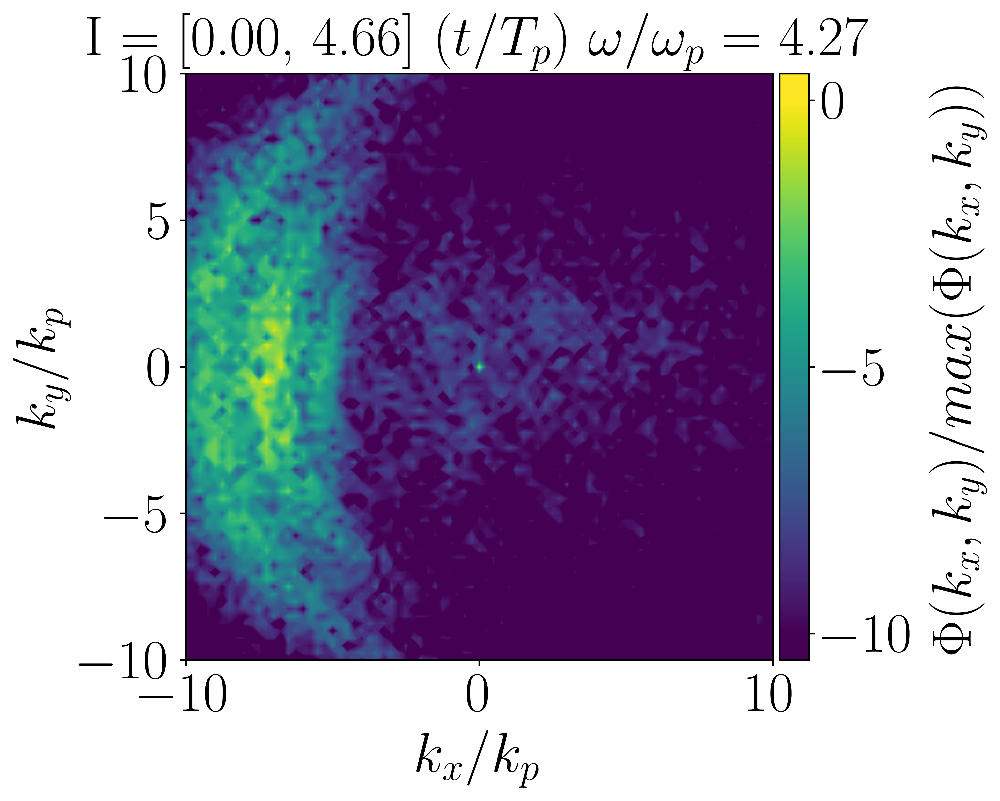

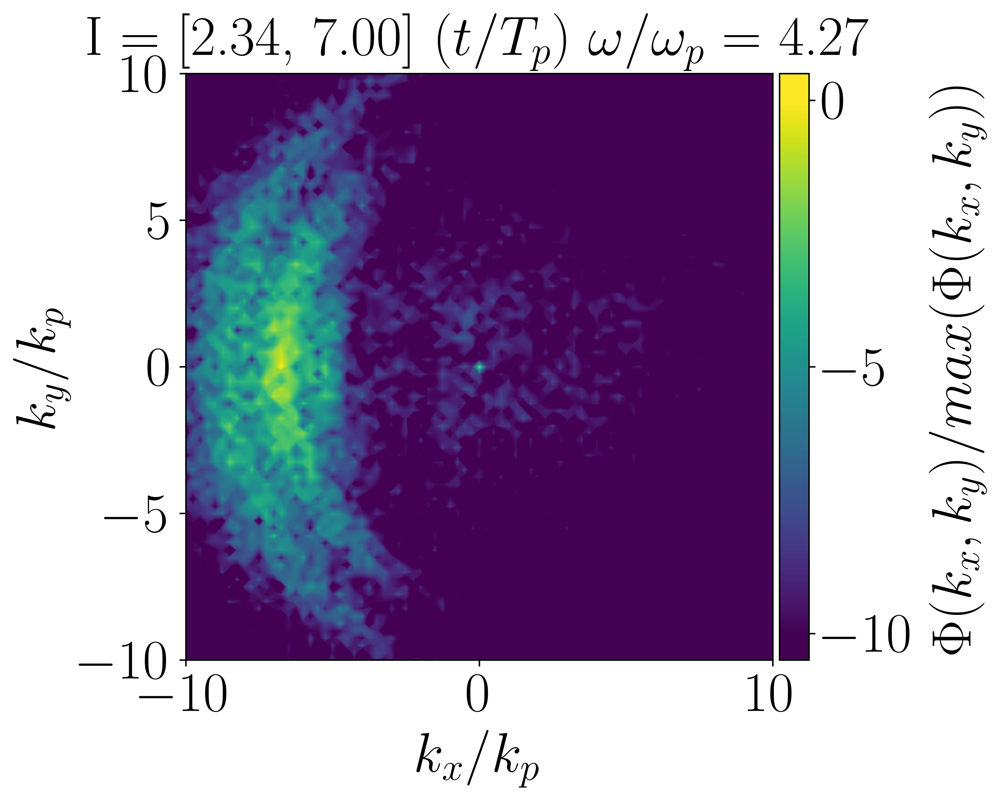

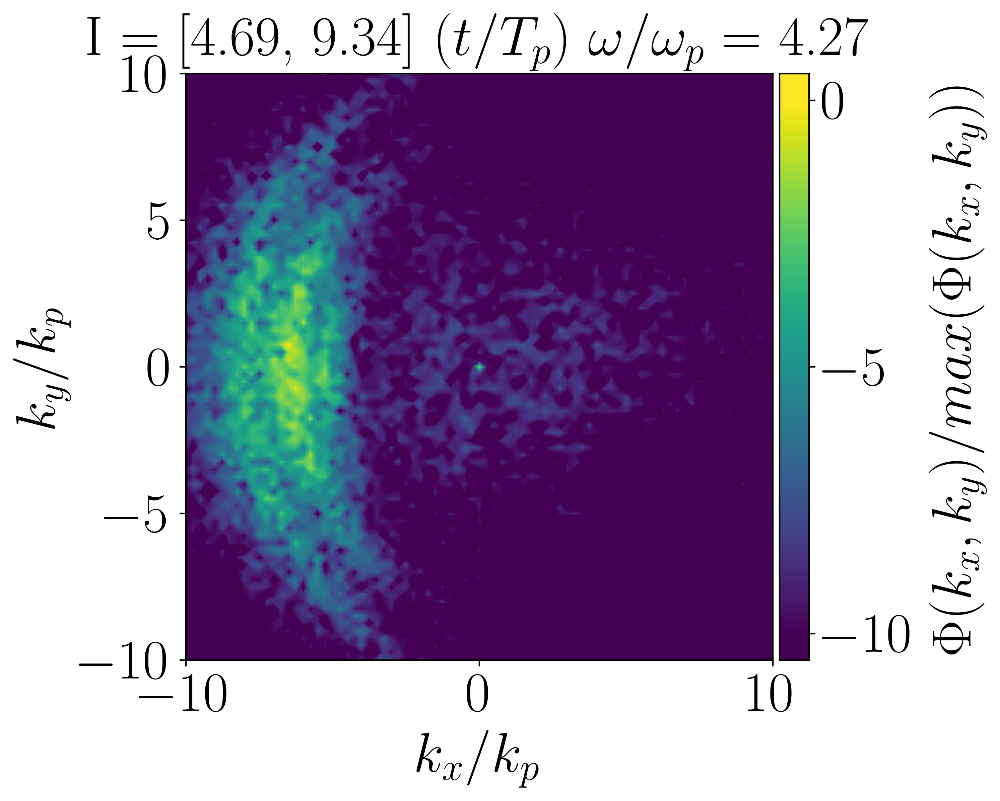

In [11]:
array = np.array(all_F_xyomega)  # Esto toma la primera subdivisión como ejemplo
print(array.shape)
dt = time[1] - time[0]
overlap_factor =0.5
overlap = int(ln * overlap_factor)
# Calcula la duración de cada intervalo basado en 'ln' y el intervalo de muestreo 'dt'
start_idx = 0
for i in range(array.shape[0]-1):
    fig, ax = plt.subplots(figsize=(6, 6))
    vmin = -10
    vmax = 0
    levels = np.linspace(vmin, vmax, 200)
    end_idx = start_idx + ln 
    im = plt.contourf(kx_tile/4, ky_tile/4, np.log(array[i,95,:, :] / np.max(array[i,95,:, :])), levels = levels, extend='both')
    time_subdivision = np.array(time[start_idx:end_idx])
    #print(time_subdivision- time[0])
    #print('interval time', time_subdivision - time[0])
    # Calcula el inicio y el final del intervalo de tiempo para esta sección
    
        # Calculate the end index of the current interval
    end_idx = start_idx + ln
    # Ensure we don't exceed the time array
    if end_idx > len(time):
        end_idx = len(time)
    time_subdivision = time[start_idx:end_idx]
    
    # Set plot limits and labels
    plt.ylim([-10, 10])
    plt.xlim([-10, 10])
    plt.xlabel(r'$k_x/k_{p}$')
    plt.ylabel(r'$k_y/k_{p}$')
    plt.gca().set_aspect('equal')

    # Set the title with the actual time interval
    ax.set_title(f'I = [{(time_subdivision[0]-time[0])*omegap/(2*np.pi):.2f}, '
                 f'{(time_subdivision[-1]-time[0])*omegap/(2*np.pi):.2f}] $(t/T_{{p}})$ $\omega/\omega_p$ = {omega[95]/omegap :.2f}',pad=10)
    
    #ax.set_ylim([-m.pi, m.pi])
    # Colorbar settings
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    cbar = fig.colorbar(im, cax=cax, orientation='vertical', extendrect='False', ticks=[vmin, (vmin+vmax)/2, vmax])
    cbar.set_label(r'$\Phi(k_{x},k_{y})/max(\Phi(k_{x},k_{y}))$',  labelpad=7)
    plt.savefig(f'/projects/DEIKE/cmartinb/graphs/kpHs{kpHs}uoc{uoc}/Ekxky_[{(time_subdivision[0]-time[0])*omegap:.2f}, {(time_subdivision[-1]-time[0])*omegap:.2f}]_omega{omega[95]/omegap :.2f}.png')
    plt.show()
    # Update start_idx to reflect the overlapping intervals
    start_idx += (ln - overlap)
    # Break the loop if the next start_idx is beyond the array length
    if start_idx >= len(time):
        break
    

array shape: (4, 150, 512, 512)
(512, 512)


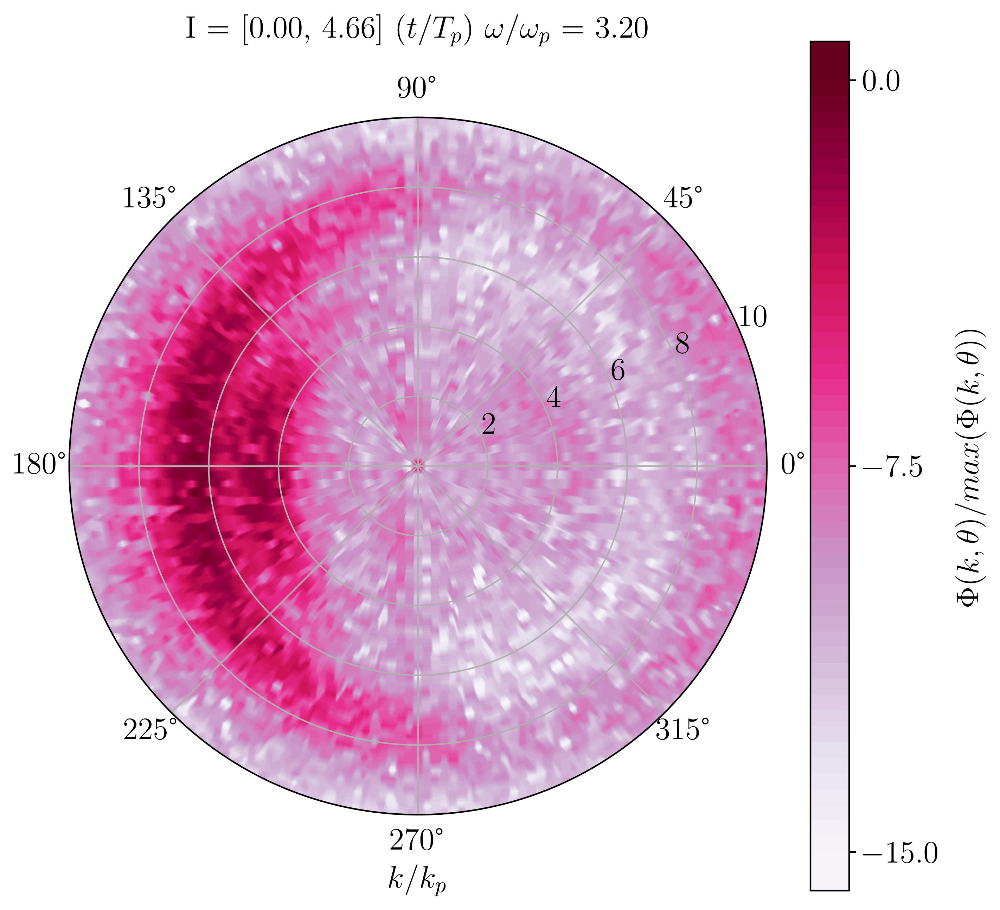

(512, 512)


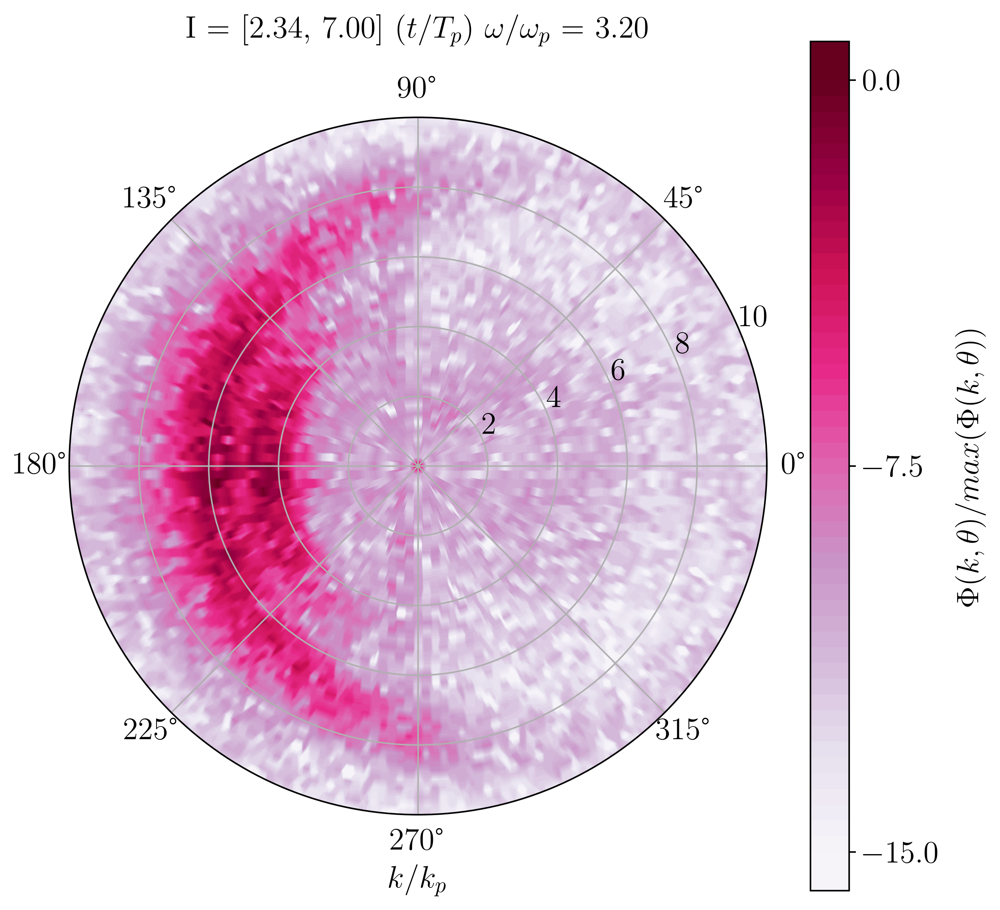

(512, 512)


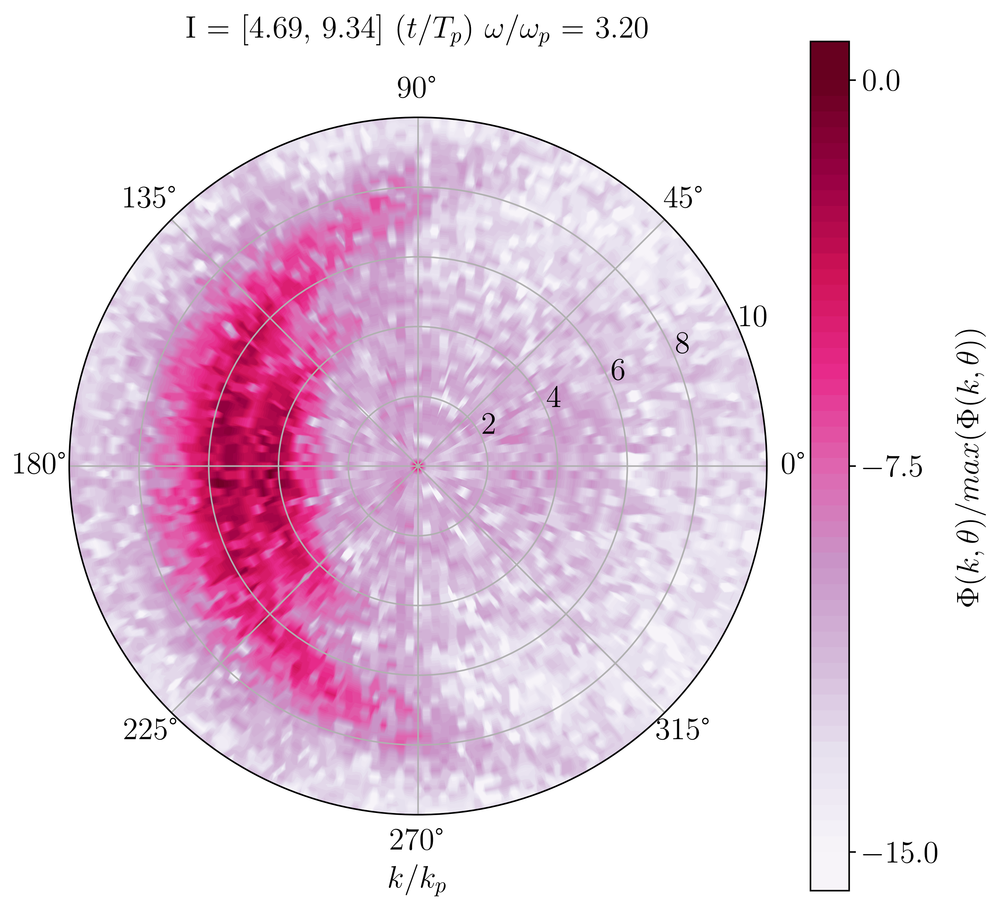

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy.ndimage import gaussian_filter

# Suponiendo que ya tienes los datos calculados: all_F_ktheta, k_tile, theta_tile, time, omegap
array = np.array(all_F_ktheta)  # Esto toma la primera subdivisión como ejemplo
print("array shape:", array.shape)

dt = time[1] - time[0]
overlap_factor = 0.5
overlap = int(ln * overlap_factor)

# Configurar parámetros de matplotlib
params = {'legend.fontsize': 'x-Large',
          'figure.figsize': (4, 4),
         'axes.labelsize': 16,
         'axes.titlesize':16,
         'xtick.labelsize':16,
         'ytick.labelsize':16}
pylab.rcParams.update(params)

# Calcula la duración de cada intervalo basado en 'ln' y el intervalo de muestreo 'dt'
start_idx = 0
for i in range(array.shape[0] - 1):
    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111, polar=True)
    
    vmin = -15
    vmax = 0
    levels = np.linspace(vmin, vmax, 50)
    
    end_idx = start_idx + ln
    time_subdivision = np.array(time[start_idx:end_idx])
    #print(time_subdivision - time[0])
    
    r = k_tile  # Radial values (k/kp)
    theta = theta_tile # Angular values (theta)
    R, Theta = k_tile, theta_tile
    #print(R)
    Z = np.log(array[i, 90, :, :] / np.max(array[i, 90, :, :]))  # Data for contourf
    #print("Z min:", np.min(Z))
    #print("Z max:", np.max(Z))
    
    # Filtrar valores extremos
    #Z[Z < vmin] = vmin
    #Z[Z > vmax] = vmax
    
    # Suavizar la matriz Z
    Z_smooth = gaussian_filter(Z.T, sigma=1)  # Transpose to match the polar coordinate system
    
    print(Z.shape)
    
    im = ax.contourf( theta, r/4,  Z,   levels = levels, extend='both', cmap='PuRd')
    
    plt.xlabel(r'$k/k_{p}$')
    
    # Set the title with the actual time interval
    ax.set_title(f'I = [{(time_subdivision[0] - time[0]) * omegap / (2 * np.pi):.2f}, '
                 f'{(time_subdivision[-1] - time[0]) * omegap / (2 * np.pi):.2f}] $(t/T_{{p}})$ $\omega/\omega_p$ = {omega[90] / omegap:.2f}', pad=20)
    ax.set_ylim(0, 10)
    # Colorbar settings
    cbar = fig.colorbar(im, ax=ax, orientation='vertical', extendrect='False', ticks=[vmin, (vmin + vmax) / 2, vmax])
    cbar.set_label(r'$\Phi(k,\theta)/max(\Phi(k,\theta))$', labelpad=7)
    plt.savefig(f'/projects/DEIKE/cmartinb/graphs/kpHs{kpHs}uoc{uoc}/Ektheta_[{(time_subdivision[0]-time[0])*omegap:.2f}, {(time_subdivision[-1]-time[0])*omegap:.2f}]_omega{omega[95]/omegap :.2f}.png')
    plt.show()
    
    # Update start_idx to reflect the overlapping intervals
    start_idx += (ln - overlap)
    # Break the loop if the next start_idx is beyond the array length
    if start_idx >= len(time):
        break


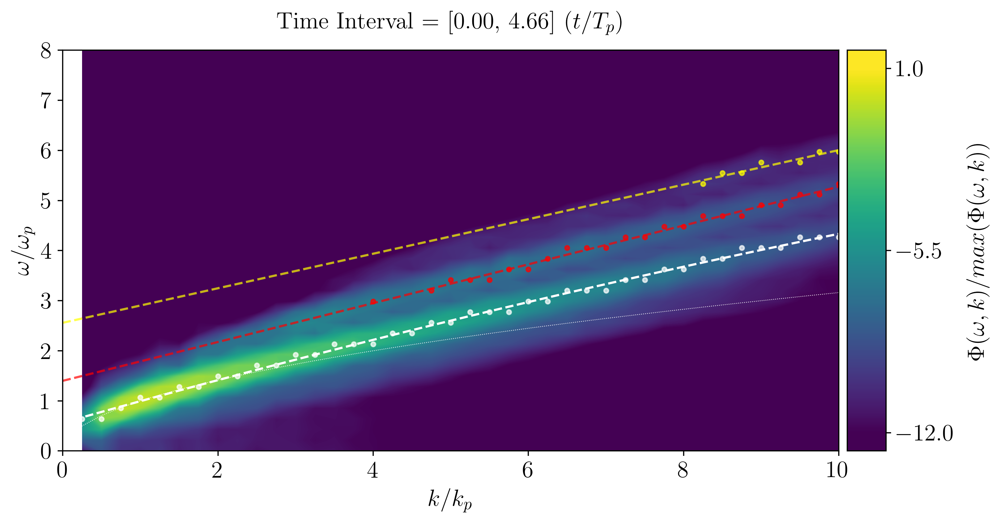

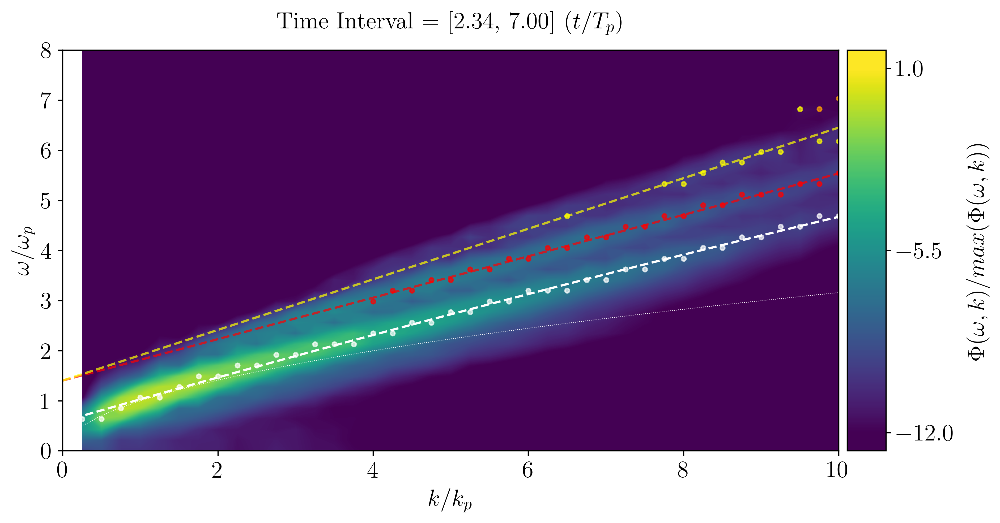

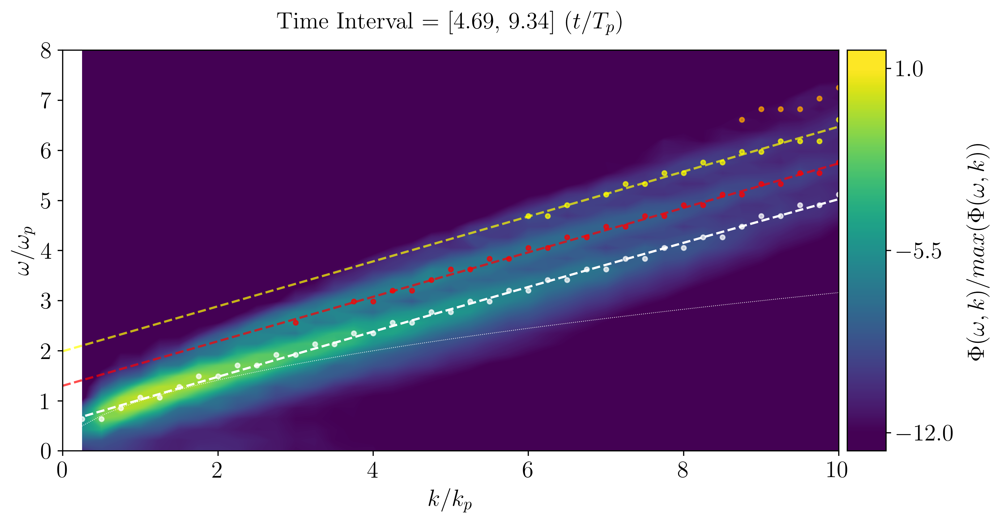

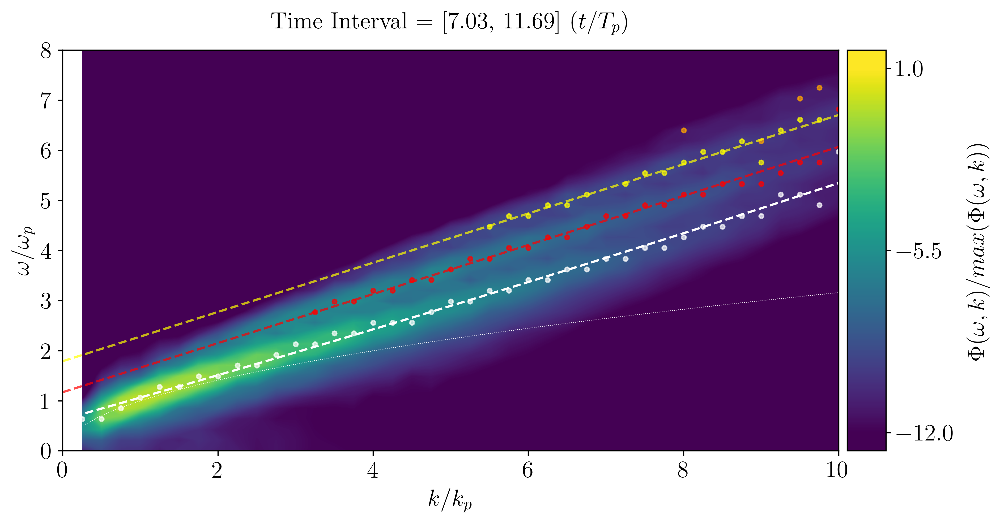

In [13]:
all_F_komega = np.array(all_F_komega)
interval_duration = ln * dt
overlap_factor = 0.5
overlap = int(ln * overlap_factor)
start_idx = 0

# Define the range of the initial quadrant
k_min = 0
k_max = 10 * 4
omega_min = 0
omega_max = 8 * omegap

# Lists to store accumulated differences and colors
differences_first = []
k_values_first = []
omega_values_first = []
interval_indices_first = []

differences_second = []
k_values_second = []
omega_values_second = []
interval_indices_second = []

differences_third = []
k_values_third = []
omega_values_third = []
interval_indices_third = []

slopes = []

num_intervals = all_F_komega.shape[0]

height_interval = [-3,-3,-3,-3, -2.3,-2.3,-2.3,-2.3]

# Ensure that height_interval has enough elements
if len(height_interval) < num_intervals:
    raise ValueError("height_interval does not have enough elements for the number of intervals")

for i in range(num_intervals):
    fig, ax = plt.subplots(figsize=(10, 5))
    vmin = -12
    vmax = 1
    levels = np.linspace(vmin, vmax, 300)
    end_idx = start_idx + ln
    if end_idx > len(time):
        end_idx = len(time)
    time_subdivision = time[start_idx:end_idx]
    norm = np.max(all_F_komega[i, :, :])
    
    # Filter indices within the quadrant
    k_indices = np.where((k >= k_min) & (k <= k_max))[0]
    omega_indices = np.where((omega >= omega_min) & (omega <= omega_max))[0]
    
    # Create the submatrix of the quadrant
    submatrix = all_F_komega[i, :][:, k_indices][omega_indices, :]
    
    im = ax.contourf(k / 4, omega / omegap, np.log(all_F_komega[i, :, :] / norm), levels=levels, extend='both')
    
    # Find peaks using find_peaks in each column of the submatrix
    first_peaks_k = []
    second_peaks_k = []
    third_peaks_k = []
    first_peaks_omega = []
    second_peaks_omega = []
    third_peaks_omega = []
    
    colors = ['white', 'red', 'yellow', 'orange']
    for col in range(submatrix.shape[1]):
        column_data = np.log(submatrix[:, col] / np.max(submatrix[:, col]))
        peaks, _ = find_peaks(column_data, distance=1, height=[height_interval[i], 0])
        k_peaks = k[col] * np.ones(len(omega[omega_indices][peaks]))
        
        for j, peak in enumerate(peaks):
            color = colors[j % len(colors)]  # Assign a different color for each peak
            ax.scatter(k_peaks[j] / 4, omega[omega_indices][peak] / omegap, color=color, s=9, alpha=0.7)
            
            # Add the peaks to the corresponding lists
            if color == 'white':
                first_peaks_k.append(k_peaks[j] / 4)
                first_peaks_omega.append(omega[omega_indices][peak] / omegap)
            elif color == 'red':
                second_peaks_k.append(k_peaks[j] / 4)
                second_peaks_omega.append(omega[omega_indices][peak] / omegap)
            elif color == 'yellow':
                third_peaks_k.append(k_peaks[j] / 4)
                third_peaks_omega.append(omega[omega_indices][peak] / omegap)
    
    # Convert the peak lists to arrays for easier handling
    first_peaks_k = np.array(first_peaks_k)
    first_peaks_omega = np.array(first_peaks_omega)
    
    second_peaks_k = np.array(second_peaks_k)
    second_peaks_omega = np.array(second_peaks_omega)
    
    third_peaks_k = np.array(third_peaks_k)
    third_peaks_omega = np.array(third_peaks_omega)
    
    # Interpolation of the maximum points
    k_fit = first_peaks_k
    omega_fit = first_peaks_omega
    
    if len(k_fit) > 0 and len(omega_fit) > 0:
        slope_fit, intercept_fit, r_value_fit, p_value_fit, std_err_fit = stats.linregress(k_fit, omega_fit)
    else:
        slope_fit, intercept_fit, r_value_fit, p_value_fit, std_err_fit = [None]*5
    
    # Interpolation of the points of the second branch
    k_fit_second = second_peaks_k
    omega_fit_second = second_peaks_omega
    
    if len(k_fit_second) > 0 and len(omega_fit_second) > 0:
        slope_second, intercept_second, r_value_second, p_value_second, std_err_second = stats.linregress(k_fit_second, omega_fit_second)
    else:
        slope_second, intercept_second, r_value_second, p_value_second, std_err_second = [None]*5
    
    # Interpolation of the points of the third branch
    k_fit_third = third_peaks_k
    omega_fit_third = third_peaks_omega
    
    if len(k_fit_third) > 0 and len(omega_fit_third) > 0:
        slope_third, intercept_third, r_value_third, p_value_third, std_err_third = stats.linregress(k_fit_third, omega_fit_third)
    else:
        slope_third, intercept_third, r_value_third, p_value_third, std_err_third = [None]*5
    
    slopes.append([slope_fit, slope_second, slope_third])
    
    if len(k_fit) > 0:  # Ensure there are valid points to fit
        if i < 10:
            # Quadratic fit for the first two intervals
            p2 = np.polyfit(k_fit, omega_fit, 2)
            fit_line2 = np.polyval(p2, np.linspace(0, 10, 100))
            ax.plot(np.linspace(0, 10, 100), fit_line2, '--', c='w', label='Quadratic Fit')
            
            dispersion_relation = np.sqrt(k_fit * g)
            fit_values = np.polyval(p2, k_fit)
            dispersion_fit_diff = dispersion_relation / omegap - fit_values
            
            # Accumulate differences and k values for the first intervals
            differences_first.extend(dispersion_fit_diff)
            k_values_first.extend(k_fit)
            omega_values_first.extend(fit_values)
            interval_indices_first.extend([i] * len(dispersion_fit_diff))  # Assign the interval index to the accumulated points
        else:
            # Cubic and linear fit for the last two intervals
            p3 = np.polyfit(k_fit, omega_fit, 3)
            inflexion_points = find_inflexion_point_cubic(p3)
            inflexion_point = inflexion_points[0]  # Take the first inflexion point found

            # Partition the data into two branches
            left_branch = k_fit <= inflexion_point
            right_branch = k_fit > inflexion_point
            
            # Linear fit for the right branch
            if np.sum(right_branch) > 1:  # Ensure there are enough points to fit
                p1 = np.polyfit(k_fit[right_branch], omega_fit[right_branch], 1)
                fit_line1 = np.polyval(p1, np.linspace(inflexion_point, 10, 100))
                ax.plot(np.linspace(inflexion_point, 10, 100), fit_line1, '--', c='w', label='Linear Fit', alpha=0.7)
                
                inflexion_omega = np.polyval(p3, inflexion_point)
                ax.scatter(inflexion_point, inflexion_omega, marker='*', s=20, c='white', zorder=5, label='Inflexion Point')

                # Cubic fit for the left branch
                fit_line3 = np.polyval(p3, np.linspace(0, inflexion_point, 100))
                ax.plot(np.linspace(0, inflexion_point, 100), fit_line3, '--', c='w', label='Cubic Fit')
                
                # Calculate the difference between the dispersion relation and the fit
                dispersion_relation = np.sqrt(k_fit * g)
                fit_values = np.concatenate((np.polyval(p3, k_fit[left_branch]), np.polyval(p1, k_fit[right_branch])))
                dispersion_fit_diff = dispersion_relation / omegap - fit_values
                
                print(dispersion_relation.shape, fit_values.shape)
                
                # Accumulate differences and k values for the last intervals
                differences_first.extend(dispersion_fit_diff)
                k_values_first.extend(k_fit)
                omega_values_first.extend(fit_values)
                interval_indices_first.extend([i] * len(dispersion_fit_diff))  # Assign the interval index to the accumulated points

    # Fit for the points of the second branch
    if len(k_fit_second) > 0:
        p_red = np.polyfit(k_fit_second, omega_fit_second, 1)
        fit_line_red = np.polyval(p_red, np.linspace(0, 10, 100))
        ax.plot(np.linspace(0, 10, 100), fit_line_red, '--', c='r', label='Red Fit', alpha=0.7)
        # Calculate the difference between the dispersion relation and the fit of the second branch
        fit_values_second = np.polyval(p_red, k_fit_second)
        
        dispersion_relation = np.sqrt(k_fit_second * g)
        dispersion_fit_diff_second = dispersion_relation / omegap - np.polyval(p_red, k_fit_second)
        
        differences_second.extend(dispersion_fit_diff_second)
        k_values_second.extend(k_fit_second)
        omega_values_second.extend(fit_values_second)
        interval_indices_second.extend([i] * len(dispersion_fit_diff_second))  # Assign the interval index to the accumulated points

    # Fit for the points of the third branch
    if len(k_fit_third) > 0:
        p_yellow = np.polyfit(k_fit_third, omega_fit_third, 1)
        fit_line_yellow = np.polyval(p_yellow, np.linspace(0, 10, 100))
        ax.plot(np.linspace(0, 10, 100), fit_line_yellow, '--', c='yellow', label='Yellow Fit', alpha=0.7)
        fit_values_third = np.polyval(p_yellow, k_fit_third)
        
        dispersion_relation = np.sqrt(k_fit_third * g)
        dispersion_fit_diff_third = dispersion_relation / omegap - np.polyval(p_yellow, k_fit_third)
        
        differences_third.extend(dispersion_fit_diff_third)
        k_values_third.extend(k_fit_third)
        omega_values_third.extend(fit_values_third)
        interval_indices_third.extend([i] * len(dispersion_fit_diff_third))  # Assign the interval index to the accumulated points
    
    dispersion_relation = np.sqrt(k * g)
    ax.plot(k / 4, dispersion_relation / omegap, ':', lw=0.5, c='w', label=r"$\omega= \sqrt{gk}$")
    
    plt.xlim([0, 10])
    plt.ylim([0, 8])
    plt.ylabel(r'$\omega/\omega_{p}$')
    plt.xlabel(r'$k/k_{p}$')

    ax.set_title(f'Time Interval = [{(time_subdivision[0] - time[0]) * omegap / (2 * np.pi):.2f}, '
                 f'{(time_subdivision[-1] - time[0]) * omegap / (2 * np.pi):.2f}] $(t/T_{{p}})$', pad=15)

    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.08)
    cbar = fig.colorbar(im, cax=cax, orientation='vertical', extendrect='False', ticks=[vmin, (vmin + vmax) / 2, vmax])
    cbar.set_label(r'$\Phi(\omega,k)/max(\Phi(\omega,k))$', labelpad=7)
    plt.savefig(f'/projects/DEIKE/cmartinb/graphs/kpHs{kpHs}uoc{uoc}/Ekomega_[{(time_subdivision[0]-time[0])*omegap:.2f}, {(time_subdivision[-1]-time[0])*omegap:.2f}].png')
    plt.show()

    start_idx += (ln - overlap)
    if start_idx >= len(time):
        break



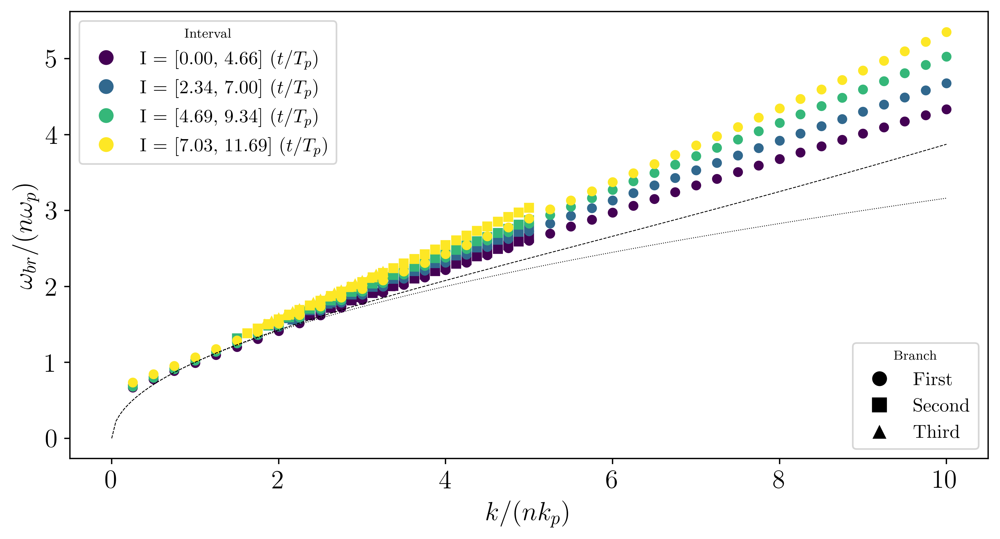

In [14]:
num_intervals = all_F_komega.shape[0]
## CALCUL SIGMA
rho = 1
sigma = (1 - 1.25 * 10**(-3)) / (200*4**2)

t_values = [2.35, 4.65, 6.96, 9.2]

normalization_factors = [np.sqrt(1), np.sqrt(1), np.sqrt(1)]

interval_indices_first = np.array(interval_indices_first, dtype=int)
interval_indices_second = np.array(interval_indices_second, dtype=int)
interval_indices_third = np.array(interval_indices_third, dtype=int)


assert len(k_values_first) == len(differences_first) == len(interval_indices_first) == len(omega_values_first), "Las longitudes de k_values_first, differences_first e interval_indices_first no coinciden"
assert len(k_values_second) == len(differences_second) == len(interval_indices_second) == len(omega_values_second), "Las longitudes de k_values_second, differences_second e interval_indices_second no coinciden"
assert len(k_values_third) == len(differences_third) == len(interval_indices_third) == len(omega_values_third), "Las longitudes de k_values_third, differences_third e interval_indices_third no coinciden"


normalized_omega_first = np.abs(np.array(omega_values_first)) / normalization_factors[0]
normalized_omega_second = np.abs(np.array(omega_values_second)) / normalization_factors[1]
normalized_omega_third = np.abs(np.array(omega_values_third)) / normalization_factors[2]

normalized_differences_first = np.abs(np.array(differences_first)) / normalization_factors[0]
normalized_differences_second = np.abs(np.array(differences_second)) / normalization_factors[1]
normalized_differences_third = np.abs(np.array(differences_third)) / normalization_factors[2]

symbols = ['o', 's', '^']
labels = ['First', 'Second', 'Third']

fig, ax = plt.subplots(figsize=(10, 5))
interval_colors = plt.cm.viridis(np.linspace(0, 1, num_intervals))
start_idx = 0


interval_ranges = []
for i in range(num_intervals):
    end_idx = start_idx + ln
    if end_idx > len(time):
        end_idx = len(time)
    time_subdivision = time[start_idx:end_idx]
    interval_ranges.append(f'I = [{(time_subdivision[0] - time[0]) * omegap / (2 * np.pi):.2f}, {(time_subdivision[-1] - time[0]) * omegap / (2 * np.pi):.2f}] $(t/T_{{p}})$')
    start_idx += (ln - overlap)
    if start_idx >= len(time):
        break

        
#t_interval_dop = [2.35, 4.65, 6.96, 9.4]   
start_idx = 0
for i in range(num_intervals):
    end_idx = start_idx + ln
    if end_idx > len(time):
        end_idx = len(time)
    time_subdivision = time[start_idx:end_idx]
    
    idx_first = interval_indices_first == i
    idx_second = interval_indices_second == i
    idx_third = interval_indices_third == i
    
    #half_length = len(u_z_avg_interpolated[i]) // 2
    #u_z_avg_half = u_z_avg_interpolated[i][:half_length]
    #u_z_avg_filtered = u_z_avg_half[u_z_avg_half < 0.1]
    #u_doppler = 1/(4*sigma*t_interval_dop[i])
    #u_doppler = 0.1
    if np.any(idx_first):
        k_first = np.array(k_values_first)[idx_first]
        ax.plot(k_first, (normalized_omega_first[idx_first])   , symbols[0], markersize=5, color=interval_colors[i], label=interval_ranges[i] if i == 0 else "") # k_first **3 *sigma/rho 
    
    if np.any(idx_second):
        k_second = np.array(k_values_second)[idx_second]
        #u_z_second = np.interp(k_second, new_phi[:len(u_z_avg_filtered)], u_z_avg_filtered)
        ax.plot(k_second/2, (normalized_omega_second[idx_second])/2  , symbols[1], markersize=5, color=interval_colors[i], label=interval_ranges[i] if i == 0 else "") #k_second **3 *sigma/rho - 
    
    if np.any(idx_third):
        k_third = np.array(k_values_third)[idx_third]
        #u_z_third = np.interp(k_third, new_phi[:len(u_z_avg_filtered)], u_z_avg_filtered)
        ax.plot(k_third/3, (normalized_omega_third[idx_third])/3, symbols[2], markersize=5, color=interval_colors[i], label=interval_ranges[i] if i == 0 else "") #k_third **3 *sigma/rho 
    start_idx += (ln - overlap)
    if start_idx >= len(time):
        break

# Añadir la relación de dispersión teórica para el agua
k_diss = np.linspace(0, 40,200)
dispersion_relation = np.sqrt(k_diss * g)
dispersion_relation_tension = np.sqrt(k_diss * g + sigma/rho * k_diss**3)
ax.plot(k_diss / 4, dispersion_relation / omegap, ':', lw=0.5, c='black', label=r"$\omega= \sqrt{gk}$")
ax.plot(k_diss / 4, dispersion_relation_tension / omegap, '--', lw=0.5, c='black', label=r"$\omega= \sqrt{gk + \sigma/\rho k^3}$")


A = 0.03
a = 1/2 * sigma /(rho*g)
b = 3/8 * k_diss * A /(rho*g)
alpha = (np.pi*a*k_diss)**2


#ax.set_yscale('log')
ax.set_xlabel(r'$k/(nk_{p})$')
ax.set_ylabel(r'$ \omega_{br} /(n\omega_{p})$')

first_legend = ax.legend([plt.Line2D([0], [0], marker=s, color='w', markerfacecolor='black', markersize=10) for s in symbols], labels, loc='lower right', title='Branch')
ax.add_artist(first_legend)
unique_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=interval_colors[i], markersize=10) for i in range(num_intervals)]
ax.legend(unique_handles, interval_ranges, loc='upper left', title='Interval')
plt.savefig(f'/projects/DEIKE/cmartinb/graphs/kpHs{kpHs}uoc{uoc}/branches_normalized.png')
plt.show()

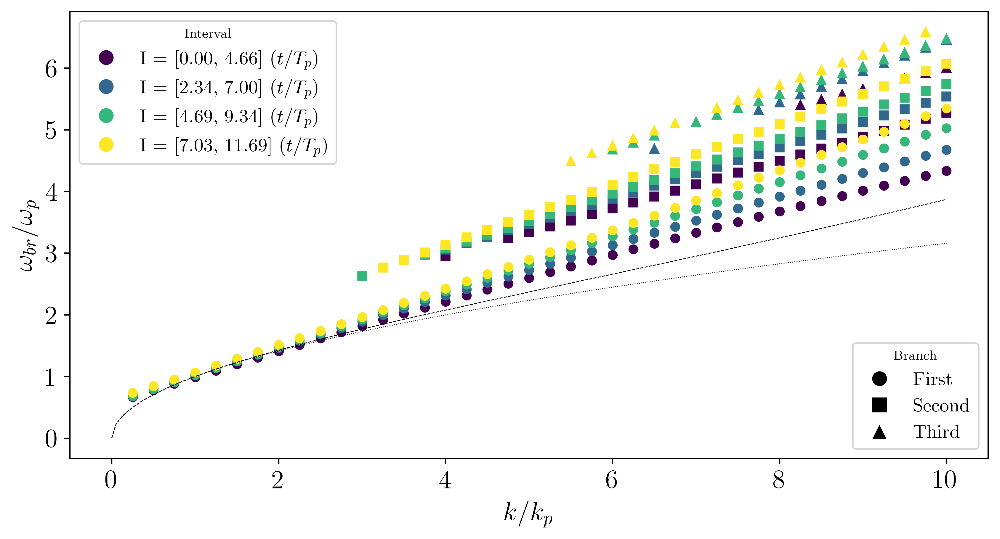

In [15]:
num_intervals = all_F_komega.shape[0]

## CALCUL SIGMA
rho = 1
sigma = (1 - 1.25 * 10**(-3)) / (200*4**2)

t_values = [2.35, 4.65, 6.96, 9.2]

fig, ax = plt.subplots(figsize=(10, 5))
interval_colors = plt.cm.viridis(np.linspace(0, 1, num_intervals))
start_idx = 0


interval_ranges = []
for i in range(num_intervals):
    end_idx = start_idx + ln
    if end_idx > len(time):
        end_idx = len(time)
    time_subdivision = time[start_idx:end_idx]
    interval_ranges.append(f'I = [{(time_subdivision[0] - time[0]) * omegap / (2 * np.pi):.2f}, {(time_subdivision[-1] - time[0]) * omegap / (2 * np.pi):.2f}] $(t/T_{{p}})$')
    start_idx += (ln - overlap)
    if start_idx >= len(time):
        break

        
#t_interval_dop = [2.35, 4.65, 6.96, 9.4]   
start_idx = 0
# Graficar los puntos con colores diferentes según el intervalo
for i in range(num_intervals):
    end_idx = start_idx + ln
    if end_idx > len(time):
        end_idx = len(time)
    time_subdivision = time[start_idx:end_idx]
    
    idx_first = interval_indices_first == i
    idx_second = interval_indices_second == i
    idx_third = interval_indices_third == i
    
    #half_length = len(u_z_avg_interpolated[i]) // 2
    #u_z_avg_half = u_z_avg_interpolated[i][:half_length]
    #u_z_avg_filtered = u_z_avg_half[u_z_avg_half < 0.1]
    #u_doppler = 1/(4*sigma*t_interval_dop[i])
    #u_doppler = 0.1
    if np.any(idx_first):
        k_first = np.array(k_values_first)[idx_first]
        ax.plot(k_first, (normalized_omega_first[idx_first])   , symbols[0], markersize=5, color=interval_colors[i], label=interval_ranges[i] if i == 0 else "") # k_first **3 *sigma/rho 
    
    if np.any(idx_second):
        k_second = np.array(k_values_second)[idx_second]
        #u_z_second = np.interp(k_second, new_phi[:len(u_z_avg_filtered)], u_z_avg_filtered)
        ax.plot(k_second, (normalized_omega_second[idx_second])  , symbols[1], markersize=5, color=interval_colors[i], label=interval_ranges[i] if i == 0 else "") #k_second **3 *sigma/rho - 
    
    if np.any(idx_third):
        k_third = np.array(k_values_third)[idx_third]
        #u_z_third = np.interp(k_third, new_phi[:len(u_z_avg_filtered)], u_z_avg_filtered)
        ax.plot(k_third, (normalized_omega_third[idx_third]), symbols[2], markersize=5, color=interval_colors[i], label=interval_ranges[i] if i == 0 else "") #k_third **3 *sigma/rho 
    
    start_idx += (ln - overlap)
    if start_idx >= len(time):
        break

# Añadir la relación de dispersión teórica para el agua
k_diss = np.linspace(0, 40,200)
dispersion_relation = np.sqrt(k_diss * g)
dispersion_relation_tension = np.sqrt(k_diss * g + sigma/rho * k_diss**3)
ax.plot(k_diss / 4, dispersion_relation / omegap, ':', lw=0.5, c='black', label=r"$\omega= \sqrt{gk}$")
ax.plot(k_diss / 4, dispersion_relation_tension / omegap, '--', lw=0.5, c='black', label=r"$\omega= \sqrt{gk + \sigma/\rho k^3}$")


A = 0.03
a = 1/2 * sigma /(rho*g)
b = 3/8 * k_diss * A /(rho*g)
alpha = (np.pi*a*k_diss)**2

#non_linearities = np.sqrt(g * kp * (1 + a * k_diss**2 + b* A**2 *k_diss**2) + sigma/rho * k_diss**3) + u_surface*k_diss

#ax.plot(k_diss / 4, (non_linearities) / omegap, '--', lw=0.5, c='red', label=r"$\omega= \sqrt{gk(1+\alpha ak^2)}$")


#ax.set_yscale('log')
ax.set_xlabel(r'$k/k_{p}$')
ax.set_ylabel(r'$ \omega_{br} /\omega_{p}$')

# Crear leyendas separadas para las ramas y los intervalos
first_legend = ax.legend([plt.Line2D([0], [0], marker=s, color='w', markerfacecolor='black', markersize=10) for s in symbols], labels, loc='lower right', title='Branch')
ax.add_artist(first_legend)
#ax.set_title(r'$k_{{p}}H_{{s}} =0.08$ $\vspace{5cm}$ $u*/c =0.5$')
# Utiliza los rangos de intervalos originales en la leyenda
unique_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=interval_colors[i], markersize=10) for i in range(num_intervals)]
ax.legend(unique_handles, interval_ranges, loc='upper left', title='Interval')
plt.savefig(f'/projects/DEIKE/cmartinb/graphs/kpHs{kpHs}uoc{uoc}/branches.png')
plt.show()

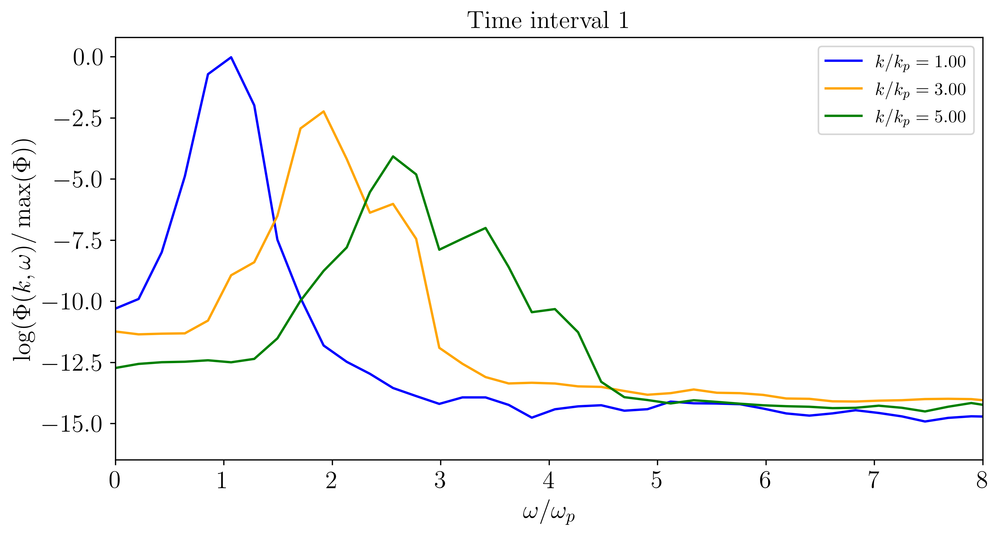

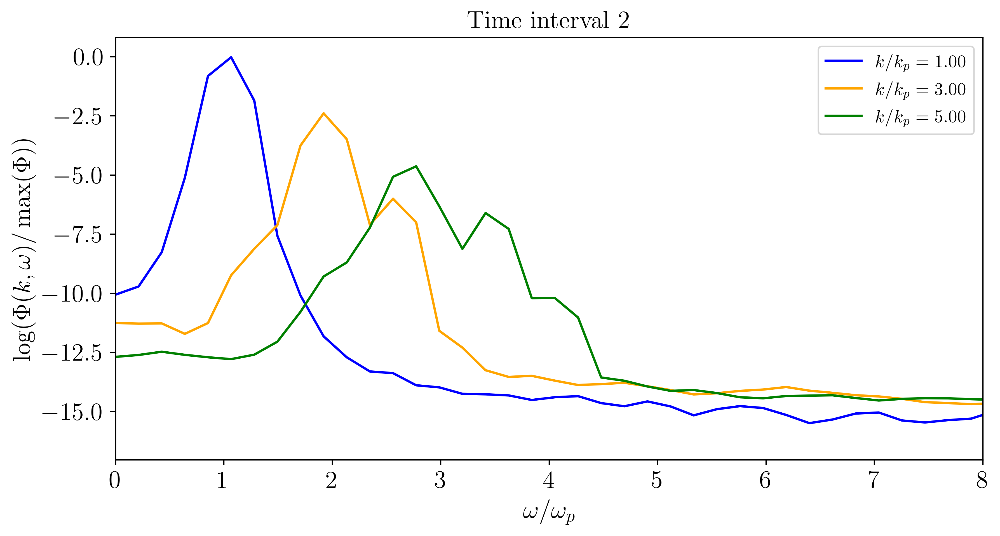

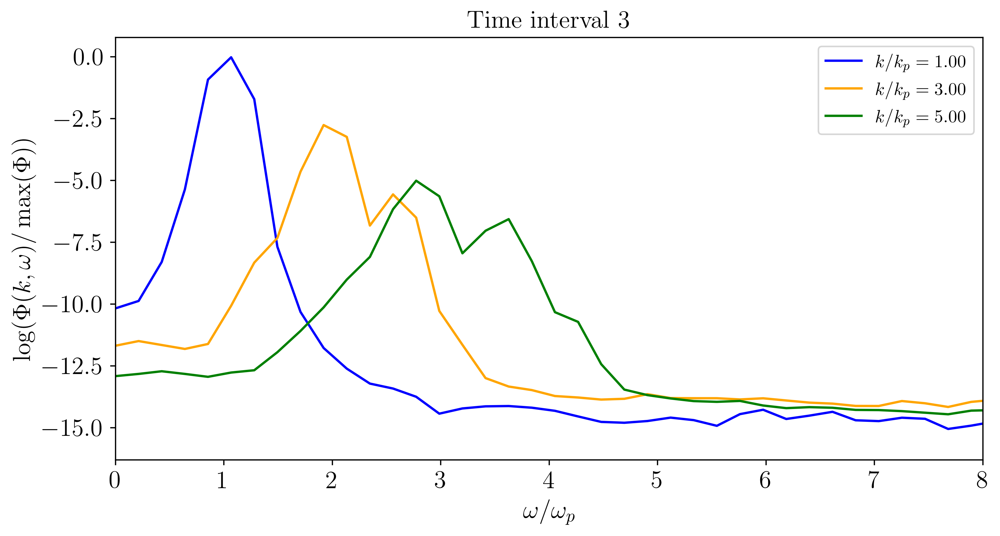

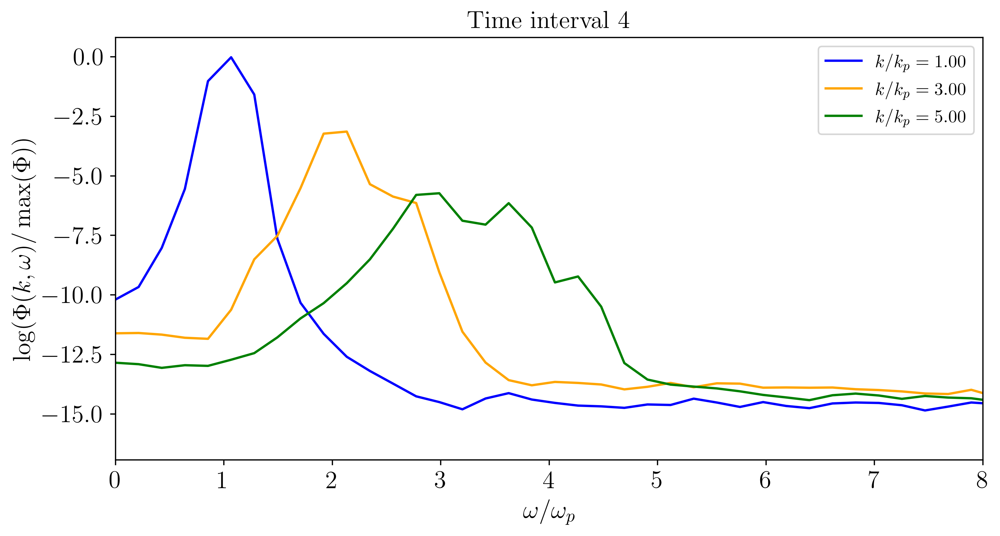

In [16]:
from matplotlib.colors import Normalize

indices_k = [4, 12, 20] 
colors = ['blue', 'orange', 'green'] 

norm = Normalize(vmin=vmin, vmax=vmax)

for i in range(all_F_komega.shape[0]):
    fig, ax = plt.subplots(figsize=(10, 5))
    
    for idx, k_idx in enumerate(indices_k):
        omega_normalized = omega / omegap
        data_normalized = np.log(all_F_komega[i, :, k_idx] / np.max(all_F_komega[i, :, :]))
        ax.plot(omega/omegap, data_normalized, label=r'$k/k_p = {:.2f}$'.format(k_idx / kp), color=colors[idx])
        plt.savefig(f'/projects/DEIKE/cmartinb/graphs/kpHs{kpHs}uoc{uoc}/Ekfixedomega_[{(time_subdivision[0]-time[0])*omegap:.2f}, {(time_subdivision[-1]-time[0])*omegap:.2f}].png')

    ax.set_xlim([0,8])
    ax.set_title(f'Time interval {i+1}')
    ax.set_xlabel(r'$\omega/\omega_{p}$')
    ax.set_ylabel(r'$\log(\Phi(k,\omega) / \max(\Phi))$')
    ax.legend()

    # Mostrar el gráfico
    plt.show()

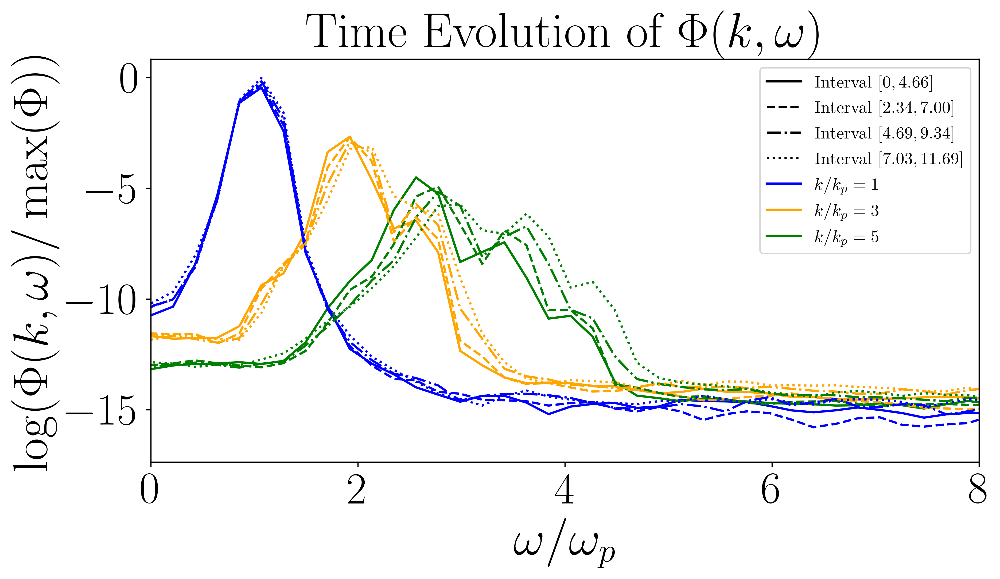

In [17]:
params = {
    'legend.fontsize': 'x-large',
    'figure.figsize': (14, 6),
    'axes.labelsize': 33,
    'axes.titlesize': 33,
    'xtick.labelsize': 30,
    'ytick.labelsize': 30,
    'font.family': 'STIXGeneral',  
    'axes.titleweight': 'normal',
    'axes.labelweight': 'normal',
    'text.usetex': True
}

plt.rcParams.update(params)

indices_k = [4, 12, 20] 
colors = ['blue', 'orange', 'green'] 
line_styles = ['-', '--', '-.', ':'] 

fig, ax = plt.subplots(figsize=(10, 5))

for time_idx in range(all_F_komega.shape[0]):
    for idx, k_idx in enumerate(indices_k):
        omega_normalized = omega / omegap
        data_normalized = np.log(all_F_komega[time_idx, :, k_idx] / np.max(all_F_komega[:, :, :]))

        ax.plot(omega_normalized, data_normalized, color=colors[idx], linestyle=line_styles[time_idx % len(line_styles)])
       
ax.set_xlim([0, 8])
ax.set_title('Time Evolution of $\Phi(k, \omega)$')
ax.set_xlabel(r'$\omega/\omega_p$')
ax.set_ylabel(r'$\log(\Phi(k,\omega) / \max(\Phi))$')

plt.plot([], [], '-', c = 'k', label = 'Interval $[0,4.66]$')
plt.plot([], [], '--', c = 'k', label = 'Interval $[2.34,7.00]$')
plt.plot([], [], '-.', c = 'k', label = 'Interval $[4.69,9.34]$')
plt.plot([], [], ':', c = 'k', label = 'Interval $[7.03,11.69]$')
plt.plot([], [], '-', c = 'b', label = '$k/k_{{p}}=1$')
plt.plot([], [], '-', c = 'orange', label = '$k/k_{{p}}=3$')
plt.plot([], [], '-', c = 'green', label = '$k/k_{{p}}=5$')
ax.legend()
plt.savefig(f'/projects/DEIKE/cmartinb/graphs/kpHs{kpHs}uoc{uoc}/Ekfixedomega.png')

# Mostrar el gráfico
plt.show()


In [18]:
data_dict = {
    'k_values_first': k_values_first,
    'differences_first': differences_first,
    'omega_values_first': omega_values_first,
    'interval_indices_first': interval_indices_first.tolist(),
    'normalized_omega_first': normalized_omega_first.tolist(),
    'normalized_differences_first': normalized_differences_first.tolist(),
    
    'k_values_second': k_values_second,
    'differences_second': differences_second,
    'omega_values_second': omega_values_second,
    'interval_indices_second': interval_indices_second.tolist(),
    'normalized_omega_second': normalized_omega_second.tolist(),
    'normalized_differences_second': normalized_differences_second.tolist(),
    
    'k_values_third': k_values_third,
    'differences_third': differences_third,
    'omega_values_third': omega_values_third,
    'interval_indices_third': interval_indices_third.tolist(),
    'normalized_omega_third': normalized_omega_third.tolist(),
    'normalized_differences_third': normalized_differences_third.tolist(),
    
    'interval_ranges': interval_ranges,
    'symbols': symbols,
    'labels': labels,
    'time': time.tolist(),
    'ln': ln,
    'overlap': overlap,
    'omegap': omegap
}


In [19]:
import json

# Guardar el diccionario en un archivo JSON
with open(F'/projects/DEIKE/cmartinb/omegas/kpHs{kpHs}_uoc{uoc}.json', 'w') as f:
    json.dump(data_dict, f)

# Cargar el diccionario desde el archivo JSON
with open(F'/projects/DEIKE/cmartinb/omegas/kpHs{kpHs}_uoc{uoc}.json', 'r') as f:
    loaded_data_dict = json.load(f)

/tmp/ipykernel_3633931/1396843021.py:49: UserWarning: Z contains NaN values. This may result in rendering artifacts.
  surf = ax.plot_surface(K/4, omega_tile/omegap, Z, cmap='viridis', alpha = 0.6, vmin=vmin, vmax=vmax, rstride=1, cstride=1,linewidth=0, antialiased=False)


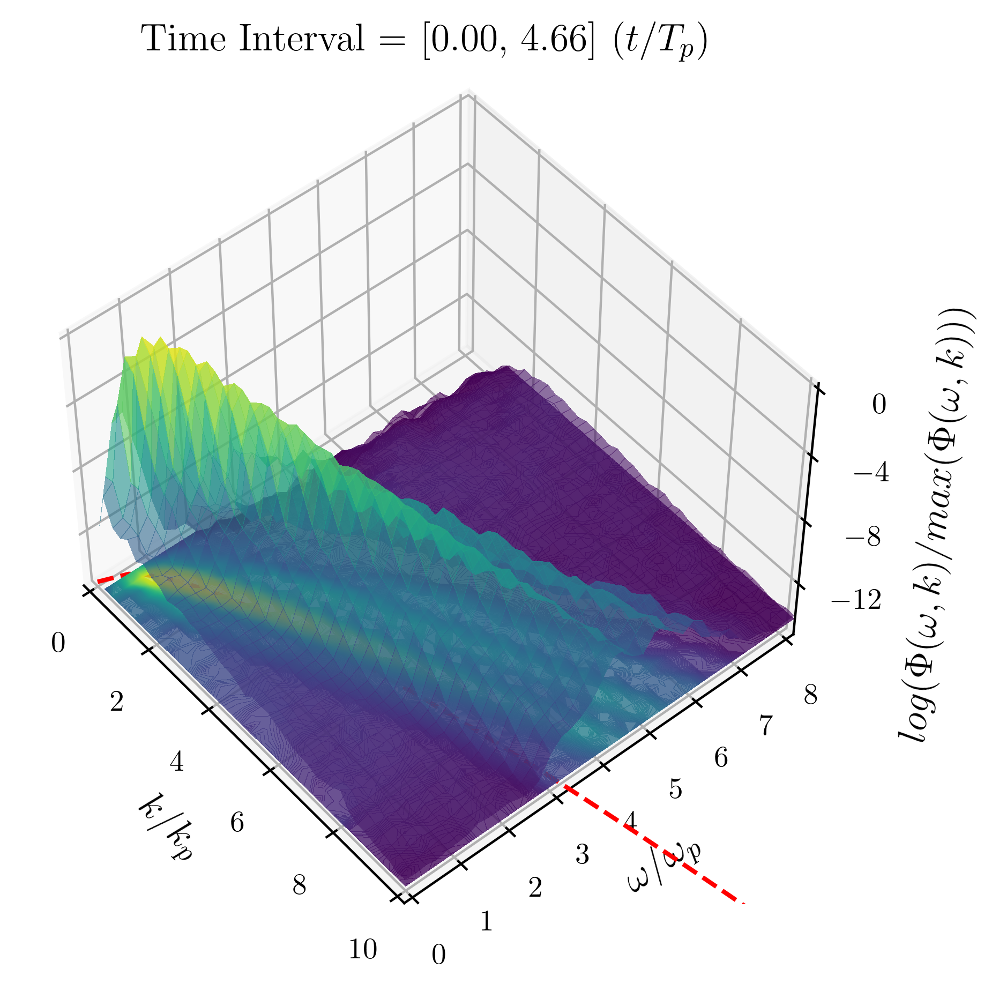

/tmp/ipykernel_3633931/1396843021.py:49: UserWarning: Z contains NaN values. This may result in rendering artifacts.
  surf = ax.plot_surface(K/4, omega_tile/omegap, Z, cmap='viridis', alpha = 0.6, vmin=vmin, vmax=vmax, rstride=1, cstride=1,linewidth=0, antialiased=False)


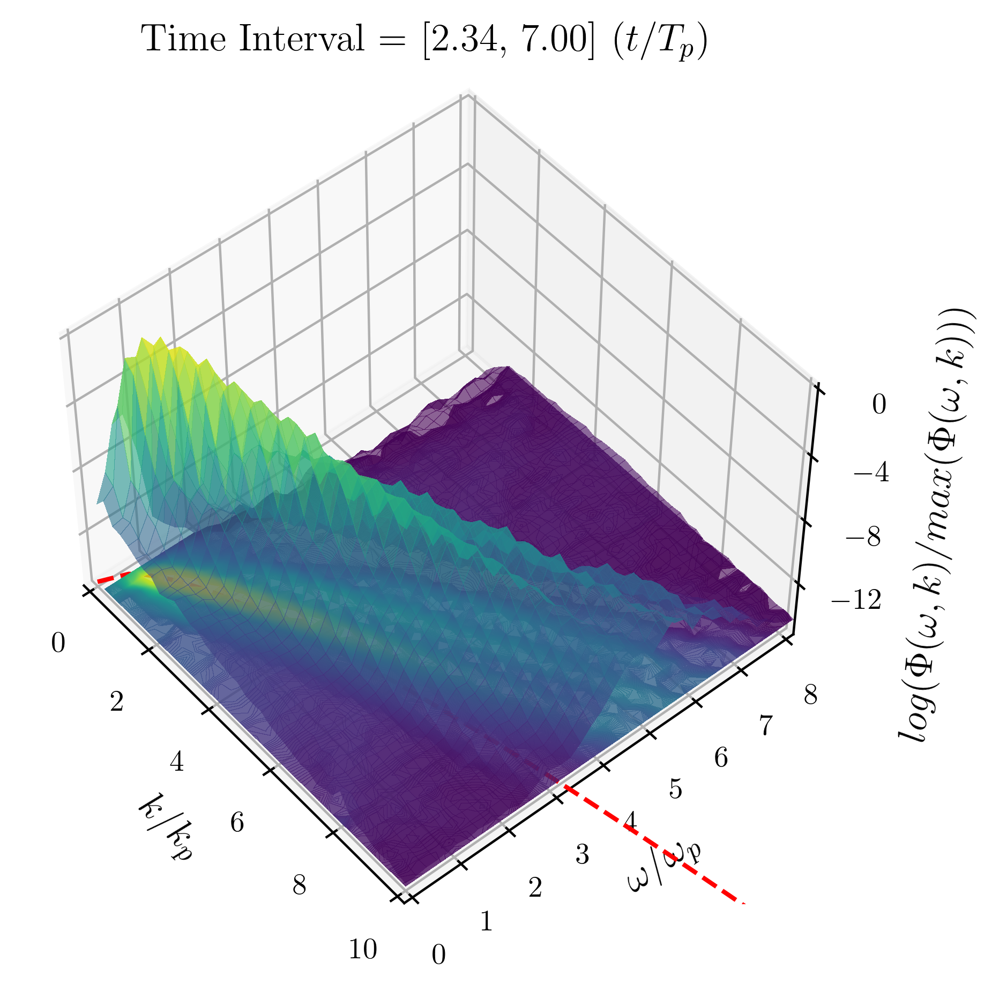

/tmp/ipykernel_3633931/1396843021.py:49: UserWarning: Z contains NaN values. This may result in rendering artifacts.
  surf = ax.plot_surface(K/4, omega_tile/omegap, Z, cmap='viridis', alpha = 0.6, vmin=vmin, vmax=vmax, rstride=1, cstride=1,linewidth=0, antialiased=False)


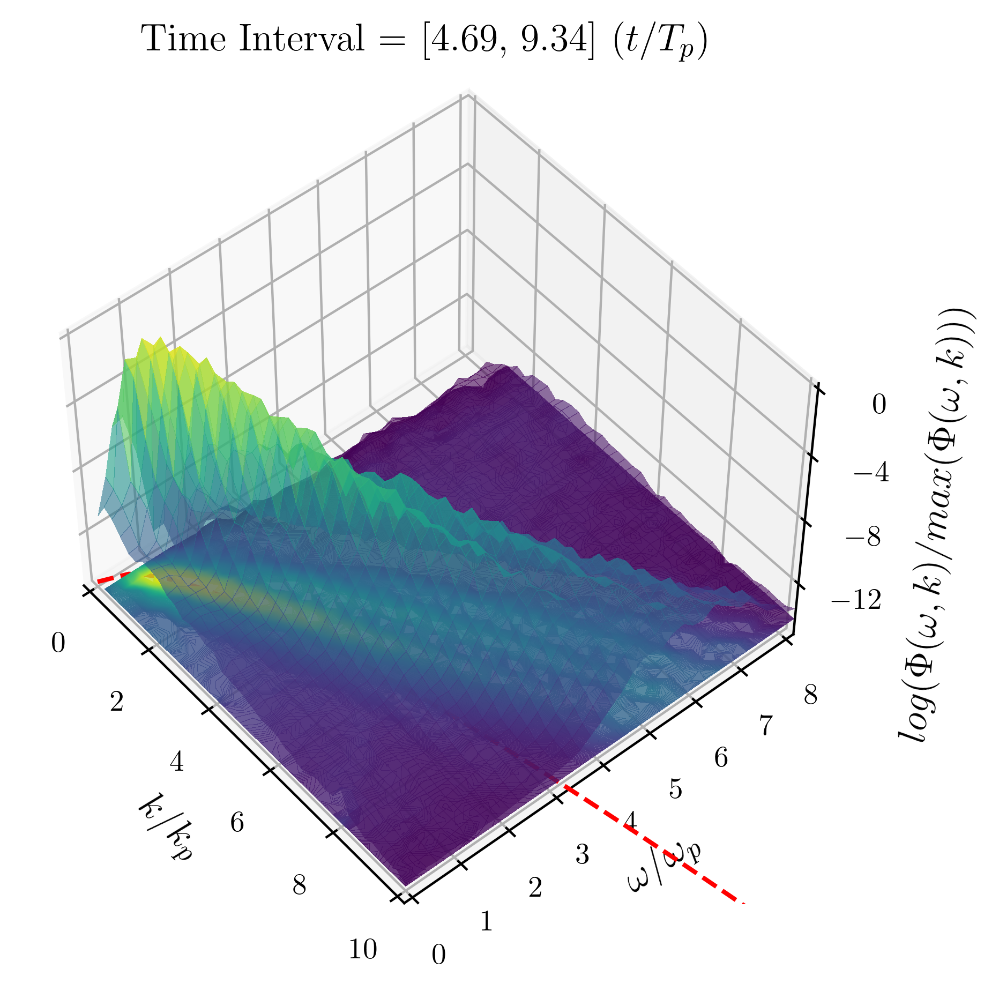

/tmp/ipykernel_3633931/1396843021.py:49: UserWarning: Z contains NaN values. This may result in rendering artifacts.
  surf = ax.plot_surface(K/4, omega_tile/omegap, Z, cmap='viridis', alpha = 0.6, vmin=vmin, vmax=vmax, rstride=1, cstride=1,linewidth=0, antialiased=False)


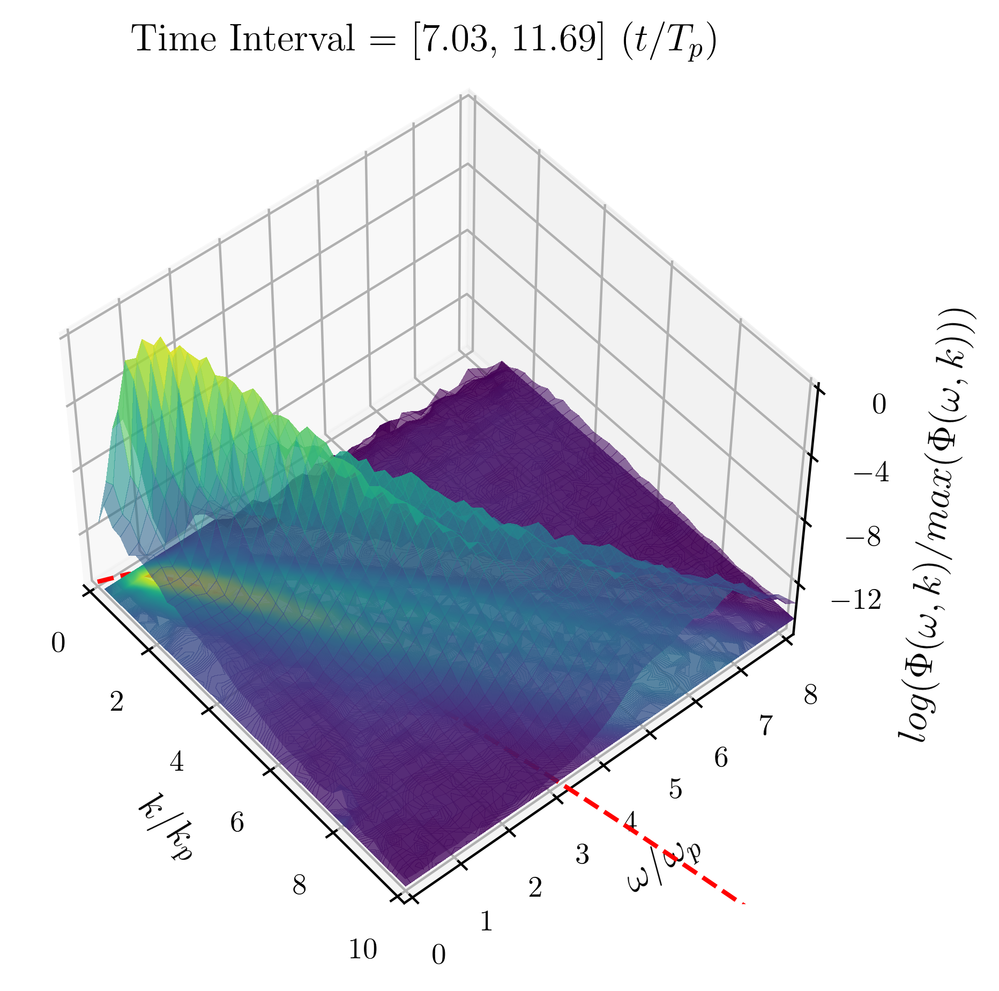

In [20]:
params = {'legend.fontsize': 'small',
          'figure.figsize': (12, 6),
          'axes.labelsize': 13,
          'axes.titlesize':13,
          'xtick.labelsize':10,
          'ytick.labelsize':10,
          'font.family': 'STIXGeneral',
          'axes.titleweight': 'normal',
          'axes.labelweight': 'normal',
          'text.usetex': True,
}

pylab.rcParams.update(params)

all_F_komega = np.array(all_F_komega)
interval_duration = ln * dt
overlap_factor = 0.5
overlap = int(ln * overlap_factor)
start_idx = 0
rango_k = (0, 40)
rango_omega = (0, 17)

Omega = omega_tile

for i in range(all_F_komega.shape[0]):
    fig = plt.figure(figsize=(10, 5))
    ax = fig.add_subplot(111, projection='3d')
    vmin = -15
    vmax = 0
    levels = np.linspace(vmin, vmax, 300)
    
    end_idx = start_idx + ln
    if end_idx > len(time):
        end_idx = len(time)
    time_subdivision = time[start_idx:end_idx]
    norm = np.max(all_F_komega[i, :, :])


    Z = np.log(all_F_komega[i, :, :] / norm)
    Z[np.isnan(Z)] = vmin  # NaN ---> min value
    #print(omega_tile.shape, K.shape, Z.shape) 
    Z = np.log(all_F_komega[i, :, :] / norm)
    Z = np.where((K >= rango_k[0]) & (K <= rango_k[1]) & (Omega >= rango_omega[0]) & (Omega <= rango_omega[1]), Z.T, np.nan)
    
    omega_disp = (k* g)**0.5
    ax.contourf(K / 4, Omega / omegap, Z, zdir='z', offset=vmin, alpha=0.8, cmap='viridis', levels=levels)
    

    surf = ax.plot_surface(K/4, omega_tile/omegap, Z, cmap='viridis', alpha = 0.6, vmin=vmin, vmax=vmax, rstride=1, cstride=1,linewidth=0, antialiased=False)

    
    vel1 = np.sqrt(nu_water * ((time_subdivision[-1] - time[0]) - (time_subdivision[0] - time[0])))
    vel4 = np.sqrt(4 * nu_water * ((time_subdivision[-1] - time[0]) - (time_subdivision[0] - time[0])))
    vel8 = np.sqrt(8 * nu_water * ((time_subdivision[-1] - time[0]) - (time_subdivision[0] - time[0])))

    
    ax.plot(k / 4, (k * g)**0.5 / omegap, zs=vmin, zdir='z', linestyle='--', linewidth=1.5, color='red', label='Linear Dispersion Relation')
    ax.view_init(elev=50, azim=-40)  
    ax.set_xlim([0, 10])
    ax.set_ylim([0, 8])
    ax.set_zlim([vmin, vmax])
    
    ax.set_xlabel(r'$k/k_{p}$')
    ax.set_ylabel(r'$\omega/\omega_{p}$')
    ax.set_zlabel(r'$log(\Phi(\omega,k)/max(\Phi(\omega,k)))$')
    ax.zaxis.set_major_locator(plt.MaxNLocator(4))

    ax.set_title(f'Time Interval = [{(time_subdivision[0]-time[0])*omegap/(2*np.pi):.2f}, '
                 f'{(time_subdivision[-1]-time[0])*omegap/(2*np.pi):.2f}] $(t/T_{{p}})$', pad=15)
    plt.savefig(f'/projects/DEIKE/cmartinb/graphs/kpHs{kpHs}uoc{uoc}/E3D_[{(time_subdivision[0]-time[0])*omegap:.2f}, {(time_subdivision[-1]-time[0])*omegap:.2f}].png')
    plt.show()

    start_idx += (ln - overlap)
    if start_idx >= len(time):
        break
